In [1]:
import tensorflow as tf
import glob
from matplotlib import pyplot as plt
%matplotlib inline
import os
import concurrent.futures
import random
import time
import numpy as np
from sklearn.model_selection import train_test_split
from PIL import Image as im
from skimage.filters import threshold_otsu, threshold_multiotsu

2024-02-15 21:51:06.822699: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-15 21:51:06.822738: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-15 21:51:06.823872: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-15 21:51:06.829780: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-15 21:51:07.542066: W tensorflow/comp

In [2]:
print("TensorFlow version:", tf.__version__)

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    print("Active GPU devices:")
    for gpu in gpus:
        print("  -", gpu.name)
else:
    print("No GPU devices found.")

TensorFlow version: 2.15.0
Active GPU devices:
  - /physical_device:GPU:0
  - /physical_device:GPU:1


In [3]:
aug_dir = "/home/ifang/HEDS/data/cycleGAN/AugmentedData_cycleGAN_real_thresholded"


A_paths = sorted( 
    [
        os.path.join(aug_dir, fname)
        for fname in os.listdir(aug_dir)
        if "real_images_" in fname and "groundtruth_"  in fname
    ]
)

B_paths = sorted( 
    [
        os.path.join(aug_dir, fname)
        for fname in os.listdir(aug_dir)
        if "groundtruth_" not in fname
    ]
)

In [4]:
len(A_paths)

1000

In [5]:
len(B_paths)

1000

In [6]:
# def load_img(img_path): 
#     img = im.open(img_path)
#     grey_img = img.convert('L')
#     grey_img = grey_img.resize((256,256))
#     np_img = np.expand_dims(grey_img, axis=-1)
#     return np_img

# A = np.array([load_img(path) for path in A_paths])
# B = np.array([load_img(path) for path in B_paths])

In [7]:
# plt.imshow(A[0])

In [8]:
# plt.imshow(B[0])

In [9]:
train_A_paths, test_A_paths, train_B_paths, test_B_paths = train_test_split(A_paths, B_paths,
                                                  test_size=0.2,
                                                  random_state=0
                                                  )

In [10]:
IMSIZE = 256

def segment_two_phase(image):
    otsu_thresh = threshold_otsu(image)
    
    binary_image = np.zeros_like(image)
    
    binary_image[image > otsu_thresh] = 128  
    
    return binary_image
    

def read_img_a(path):
    img = tf.keras.utils.load_img(path, color_mode='grayscale', target_size=(IMSIZE, IMSIZE))
    np_img = np.array(img)
    thresh_img = segment_two_phase(np_img)
    return thresh_img

def prepare_dataset_a(namelist):
    start = time.time()
    imgs = []
    with concurrent.futures.ThreadPoolExecutor(max_workers = 16) as executor:
        i = 0
        for value in executor.map(read_img_a, namelist):
            i+=1
            print("\rFetching: [{}/{}]".format(i, len(namelist)), end="", flush=True)
            imgs.append(value)
        imgs = np.stack(imgs)
        imgs = tf.convert_to_tensor(imgs)
        imgs = tf.expand_dims(imgs,axis=-1)
    print("\nExecution time: ",time.time() - start, "s")
    return imgs

In [11]:
# with tf.device('/gpu:0'):
#     train_a= prepare_dataset(train_A_paths)
#     train_b= prepare_dataset(train_B_paths)
#     test_a= prepare_dataset(test_A_paths)
#     test_b= prepare_dataset(test_B_paths)
# print("Training A tensor shape", train_a.shape)
# print("Training B tensor shape", train_b.shape)
# print("Testing A tensor shape", test_a.shape)
# print("Testing B tensor shape", test_b.shape)

In [12]:
with tf.device('/gpu:0'):
    train_a= prepare_dataset_a(train_A_paths)
    test_a= prepare_dataset_a(test_A_paths)
print("Training A tensor shape", train_a.shape)
print("Testing A tensor shape", test_a.shape)

Fetching: [53/800]

2024-02-15 21:51:09.106614: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 21635 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:17:00.0, compute capability: 8.6
2024-02-15 21:51:09.107301: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22457 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:65:00.0, compute capability: 8.6


Fetching: [800/800]
Execution time:  0.8807108402252197 s
Fetching: [200/200]
Execution time:  0.1855461597442627 s
Training A tensor shape (800, 256, 256, 1)
Testing A tensor shape (200, 256, 256, 1)


In [13]:
def segment_three_phase(diff_image):
    thresholds = threshold_multiotsu(diff_image, classes=3)
    
    colorized_image = np.full(diff_image.shape, 128, dtype=np.uint8)  # Gray
    
    colorized_image[diff_image <= thresholds[0]] = 0  # Black
    
    colorized_image[diff_image > thresholds[1]] = 255  # White
    
    return colorized_image
    
def read_img_b(path):
    img = tf.keras.utils.load_img(path, color_mode='grayscale', target_size=(IMSIZE, IMSIZE))
    np_img = np.array(img)
    thresh_img = segment_three_phase(np_img)
    return thresh_img
    
def prepare_dataset_b(namelist):
    start = time.time()
    imgs = []
    with concurrent.futures.ThreadPoolExecutor(max_workers = 16) as executor:
        i = 0
        for value in executor.map(read_img_b, namelist):
            i+=1
            print("\rFetching: [{}/{}]".format(i, len(namelist)), end="", flush=True)
            imgs.append(value)
        imgs = np.stack(imgs)
        imgs = tf.convert_to_tensor(imgs)
        imgs = tf.expand_dims(imgs,axis=-1)
    print("\nExecution time: ",time.time() - start, "s")
    return imgs

In [1]:
with tf.device('/gpu:0'):
    train_b= prepare_dataset_b(train_B_paths)
    test_b= prepare_dataset_b(test_B_paths)
print("Training B tensor shape", train_b.shape)
print("Testing B tensor shape", test_b.shape)

NameError: name 'tf' is not defined

In [15]:
np.unique(train_a)

array([  0, 128], dtype=uint8)

In [16]:
np.unique(train_b)

array([  0, 128, 255], dtype=uint8)

This code defines a function called map that takes an input called image. The purpose of this function is to preprocess the input image by converting its pixel values to a different range. The steps it performs are:

    image = tf.cast(image, tf.float32): This line converts the datatype of the image tensor to float32 using TensorFlow's tf.cast() function. This is often done because some operations require the data to be in a specific format, and float32 is a common format for images in deep learning applications.

    image = image / 255: This line scales the pixel values of the image from the range [0, 255] to the range [0, 1]. This is a common normalization technique for images, as it brings the pixel values into a more suitable range for neural networks.

    image = image * 2 - 1: This line further scales the pixel values from the range [0, 1] to the range [-1, 1]. This can be useful in some cases, as it centers the data around 0, which can improve the convergence of the training process in some neural network architectures.

Finally, the preprocessed image is returned by the function with return image.

In [17]:
def map(image):

    image = tf.cast(image, tf.float32)
    image = image / 255
    image = image * 2 - 1
    
    return image

In [18]:
train_a = tf.data.Dataset.from_tensor_slices(train_a)
train_b = tf.data.Dataset.from_tensor_slices(train_b)
test_a = tf.data.Dataset.from_tensor_slices(test_a)
test_b = tf.data.Dataset.from_tensor_slices(test_b)

In [19]:
AUTOTUNE = tf.data.AUTOTUNE
BUFFER_SIZE = 200

train_a = train_a.map(map, 
                      num_parallel_calls=AUTOTUNE).shuffle(BUFFER_SIZE).batch(1).prefetch(AUTOTUNE)
train_b = train_b.map(map, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1).prefetch(AUTOTUNE)
test_a = test_a.map(map, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1).prefetch(AUTOTUNE)
test_b = test_b.map(map, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1).prefetch(AUTOTUNE)

In [20]:
train_dataset = tf.data.Dataset.zip((train_a, train_b))
test_dataset = tf.data.Dataset.zip((test_a, test_b))

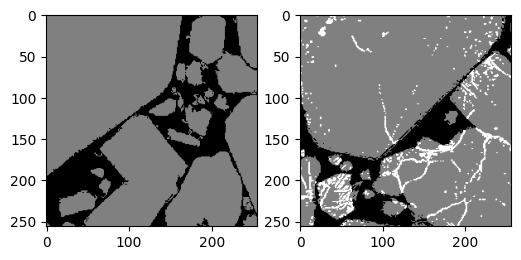

In [23]:
plt.figure(figsize=(6, 3))
for imgs_A, imgs_B in test_dataset.take(1):
    plt.subplot(1,2,1)
    plt.imshow((imgs_A[0]+1)/2, cmap='grey', vmin=0, vmax=1)
    plt.subplot(1,2,2)
    plt.imshow((imgs_B[0]+1)/2, cmap='grey', vmin=0, vmax=1)


In [24]:
def instance_normalization(x, epsilon=1e-5):
    mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
    inv = tf.math.rsqrt(variance + epsilon)
    normalized = (x - mean) * inv
    return normalized

In [25]:
OUTPUT_CHANNELS = 1


def downsample(filters, size, apply_batchnorm=True, apply_dropout=False, apply_noise=False):
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                               use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.Lambda(lambda x: instance_normalization(x)))

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    if apply_noise:
        result.add(tf.keras.layers.GaussianNoise(stddev=0.1))

    result.add(tf.keras.layers.LeakyReLU())

    return result


def upsample(filters, size, apply_dropout=False, apply_noise=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    if apply_noise:
        result.add(tf.keras.layers.GaussianNoise(stddev=0.1))    

    result.add(tf.keras.layers.ReLU())

    return result


def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,1])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4, apply_noise=True), 
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4, apply_noise=True), 
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4, apply_noise=True), 
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True, apply_noise=True),
        upsample(512, 4, apply_dropout=True), 
        upsample(512, 4, apply_noise=True), 
        upsample(256, 4), 
        upsample(128, 4, apply_noise=True), 
        upsample(64, 4),
    ]


    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         activation='tanh') 

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [26]:
generator_x = Generator()  
generator_y = Generator()  


In [27]:
def Discriminator():

    inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')

    down1 = downsample(64, 4, False)(inp) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(
               512, 4, strides=1,use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    norm1 = tf.keras.layers.Lambda(lambda x: instance_normalization(x))(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(
               1, 4, strides=1)(zero_pad2)  # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

In [28]:
discriminator_x = Discriminator()
discriminator_y = Discriminator()


In [29]:
# Print the summary for each model
# generator_x.summary()

In [30]:
# generator_y.summary()

In [31]:
# discriminator_x.summary()

In [32]:
# discriminator_y.summary()

In [39]:
for example_input, example_target in test_dataset.take(1):
    pass

In [40]:
def image_show():
    
    title=['Source domain','Target domain','Map']
    rendered_pictures = generator_x(example_input, training=False)
    rendered_picture = rendered_pictures[0]
    fig, axs = plt.subplots(1,3)
    plt.subplot(1,3,1)
    plt.imshow((example_input[0].numpy()+1)/2, cmap='gray', vmin=0, vmax=1)
    plt.title(title[0])
    plt.subplot(1,3,2)
    plt.imshow((example_target[0].numpy()+1)/2,  cmap='gray', vmin=0, vmax=1)       
    plt.title(title[1])
    plt.subplot(1,3,3)
    plt.imshow((rendered_picture.numpy()+1)/2,  cmap='gray', vmin=0, vmax=1)
    plt.title(title[2])
    for ax in axs.flatten():
        ax.axis('off')
    
    plt.show()
    
    return rendered_pictures

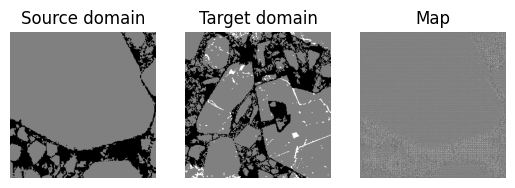

In [41]:
pred = image_show()

In [42]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
LAMBDA = 7

def discriminator_loss(disc_real_output, disc_fake_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    fake_loss = loss_object(tf.zeros_like(disc_fake_output), disc_fake_output)
    total_disc_loss = real_loss + fake_loss
    return total_disc_loss


def generator_loss(disc_fake_output):
    gen_loss = loss_object(tf.ones_like(disc_fake_output), disc_fake_output)
    return gen_loss


def calc_cycle_loss(real_image, cycled_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

In [43]:
generator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [44]:
@tf.function
def train_discriminator(image_a, image_b):
    with tf.GradientTape(persistent=True) as discriminator_tape:
        fake_b = generator_x(image_a, training=True)
        cycled_a = generator_y(fake_b, training=True)
        fake_a = generator_y(image_b, training=True)
        cycled_b = generator_x(fake_a, training=True)
        disc_real_a = discriminator_x(image_a, training=True)
        disc_real_b = discriminator_y(image_b, training=True)
        disc_fake_a = discriminator_x(fake_a, training=True)
        disc_fake_b = discriminator_y(fake_b, training=True)

        discriminator_x_loss = discriminator_loss(disc_real_a, disc_fake_a)
        discriminator_y_loss = discriminator_loss(disc_real_b, disc_fake_b)
        
    discriminator_x_gradients = discriminator_tape.gradient(discriminator_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = discriminator_tape.gradient(discriminator_y_loss, discriminator_y.trainable_variables)

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,discriminator_y.trainable_variables))

In [45]:
@tf.function
def train_generator(image_a, image_b):
    with tf.GradientTape(persistent=True) as generator_tape:
        fake_b = generator_x(image_a, training=True)
        cycled_a = generator_y(fake_b, training=True)
        fake_a = generator_y(image_b, training=True)
        cycled_b = generator_x(fake_a, training=True)
        disc_fake_a = discriminator_x(fake_a, training=True)
        disc_fake_b = discriminator_y(fake_b, training=True)

        gen_x_loss = generator_loss(disc_fake_b)
        gen_y_loss = generator_loss(disc_fake_a)
        
        total_cycle_loss = calc_cycle_loss(image_a, cycled_a) + calc_cycle_loss(image_b, cycled_b)
        
        total_gen_x_loss = gen_x_loss + total_cycle_loss
        total_gen_y_loss = gen_y_loss + total_cycle_loss
        
    generator_x_gradients = generator_tape.gradient(total_gen_x_loss, generator_x.trainable_variables)
    generator_y_gradients = generator_tape.gradient(total_gen_y_loss, generator_y.trainable_variables)
    
    generator_x_optimizer.apply_gradients(zip(generator_x_gradients, generator_x.trainable_variables))
    generator_y_optimizer.apply_gradients(zip(generator_y_gradients, generator_y.trainable_variables))

In [46]:
Epochs = 100


Epoch 1/100 


2024-02-15 21:56:33.626836: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_8/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-02-15 21:56:35.305306: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fb9d64a9200 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-02-15 21:56:35.305339: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-02-15 21:56:35.305345: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-02-15 21:56:35.309476: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1708055795.388275  547683 dev

Training: [--------->] 100 %  - 83 s


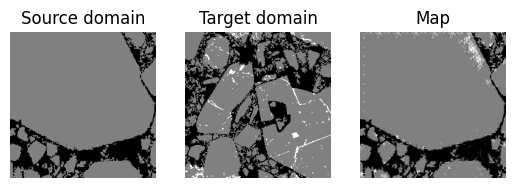


Epoch 2/100 
Training: [--------->] 100 %  - 60 s


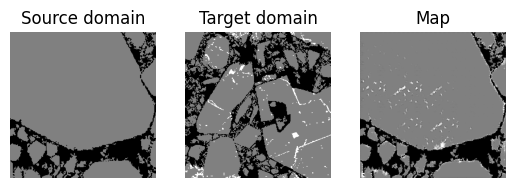


Epoch 3/100 
Training: [--------->] 100 %  - 63 s


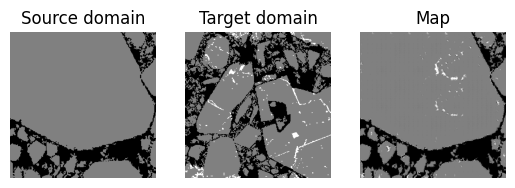


Epoch 4/100 
Training: [--------->] 100 %  - 61 s


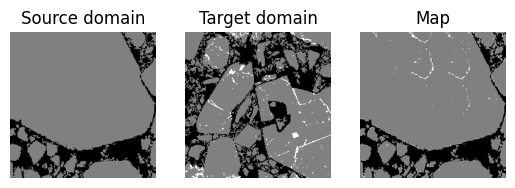


Epoch 5/100 
Training: [--------->] 100 %  - 60 s


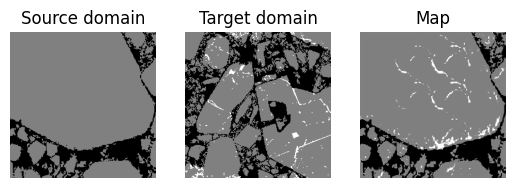


Epoch 6/100 
Training: [--------->] 100 %  - 59 s


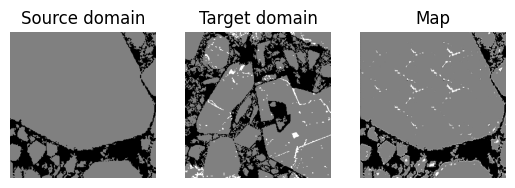


Epoch 7/100 
Training: [--------->] 100 %  - 59 s


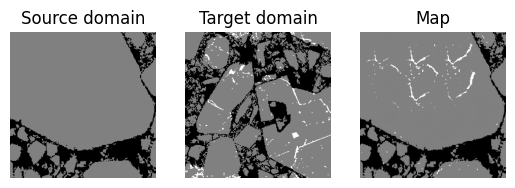


Epoch 8/100 
Training: [--------->] 100 %  - 59 s


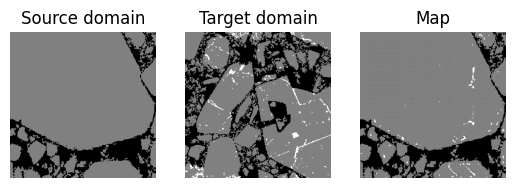


Epoch 9/100 
Training: [--------->] 100 %  - 59 s


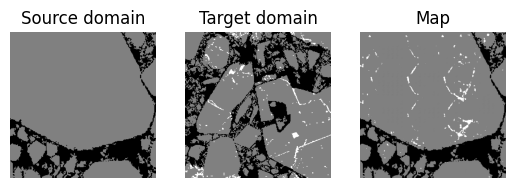


Epoch 10/100 
Training: [--------->] 100 %  - 59 s


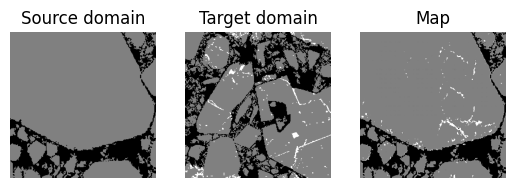


Epoch 11/100 
Training: [--------->] 100 %  - 59 s


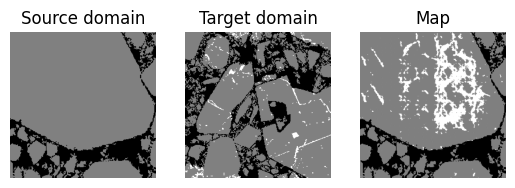


Epoch 12/100 
Training: [--------->] 100 %  - 55 s


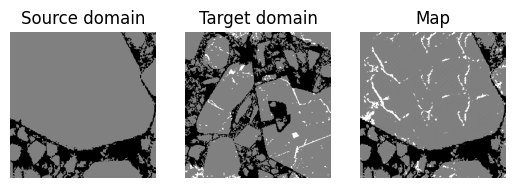


Epoch 13/100 
Training: [--------->] 100 %  - 51 s


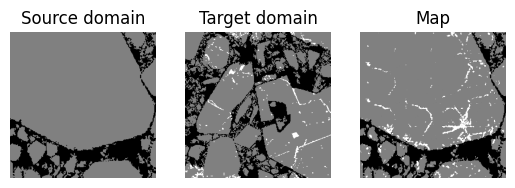


Epoch 14/100 
Training: [--------->] 100 %  - 51 s


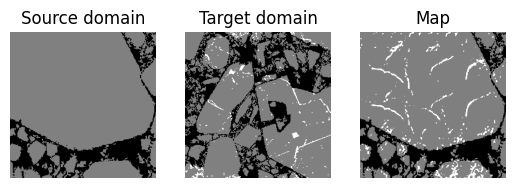


Epoch 15/100 
Training: [--------->] 100 %  - 51 s


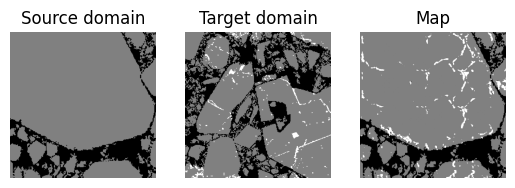


Epoch 16/100 
Training: [--------->] 100 %  - 51 s


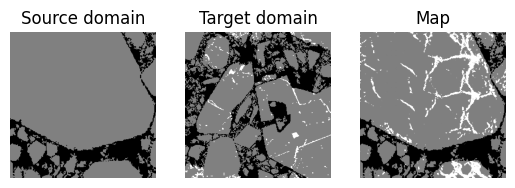


Epoch 17/100 
Training: [--------->] 100 %  - 51 s


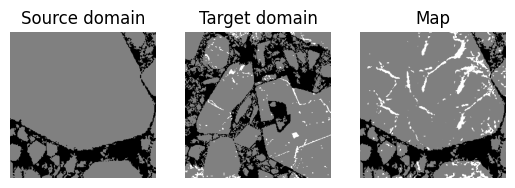


Epoch 18/100 
Training: [--------->] 100 %  - 51 s


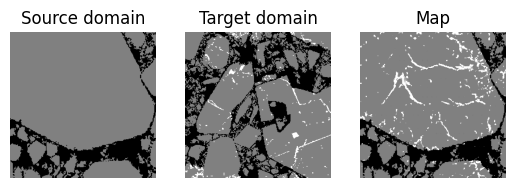


Epoch 19/100 
Training: [--------->] 100 %  - 51 s


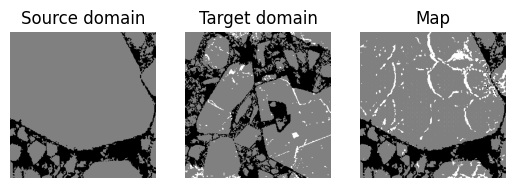


Epoch 20/100 
Training: [--------->] 100 %  - 51 s


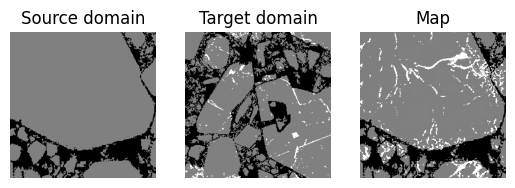


Epoch 21/100 
Training: [--------->] 100 %  - 51 s


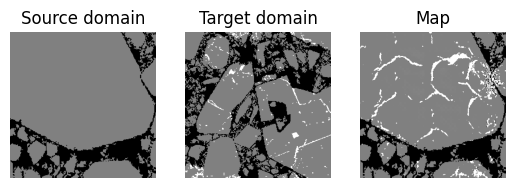


Epoch 22/100 
Training: [--------->] 100 %  - 51 s


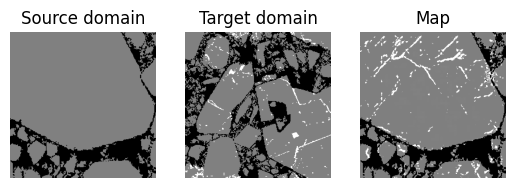


Epoch 23/100 
Training: [--------->] 100 %  - 51 s


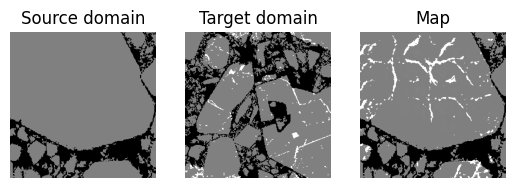


Epoch 24/100 
Training: [--------->] 100 %  - 51 s


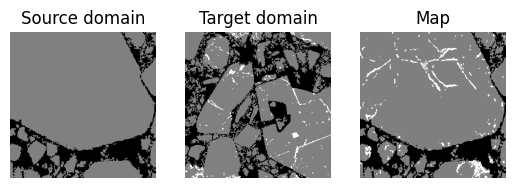


Epoch 25/100 
Training: [--------->] 100 %  - 51 s


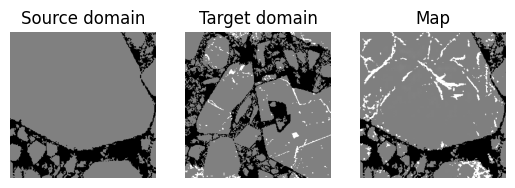


Epoch 26/100 
Training: [--------->] 100 %  - 51 s


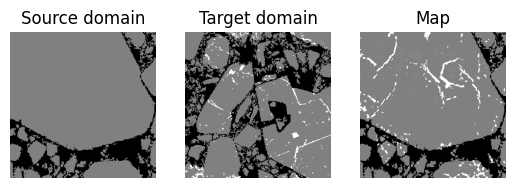


Epoch 27/100 
Training: [--------->] 100 %  - 51 s


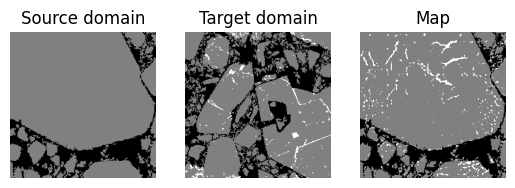


Epoch 28/100 
Training: [--------->] 100 %  - 51 s


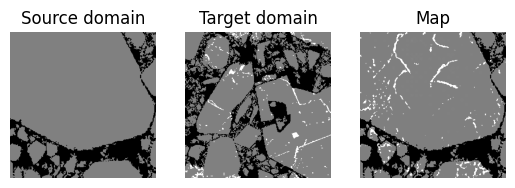


Epoch 29/100 
Training: [--------->] 100 %  - 51 s


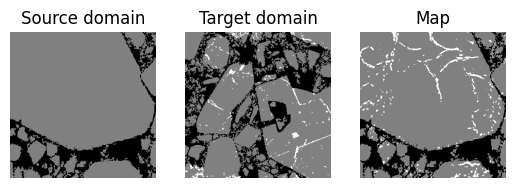


Epoch 30/100 
Training: [--------->] 100 %  - 51 s


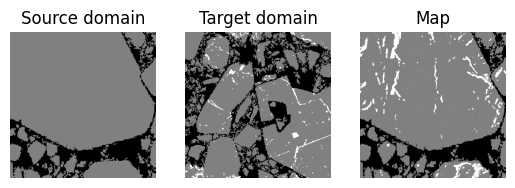


Epoch 31/100 
Training: [--------->] 100 %  - 51 s


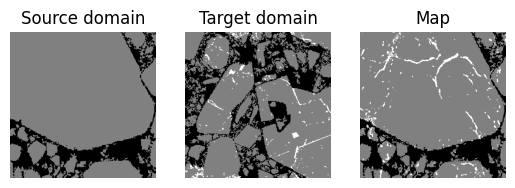


Epoch 32/100 
Training: [--------->] 100 %  - 51 s


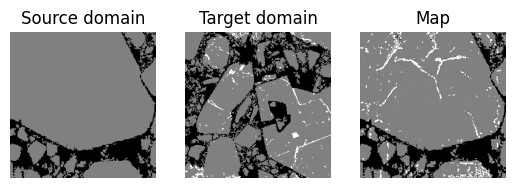


Epoch 33/100 
Training: [--------->] 100 %  - 50 s


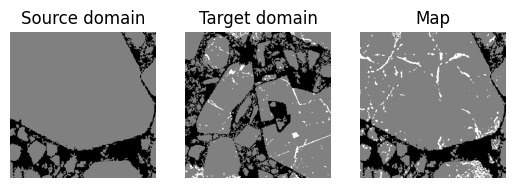


Epoch 34/100 
Training: [--------->] 100 %  - 51 s


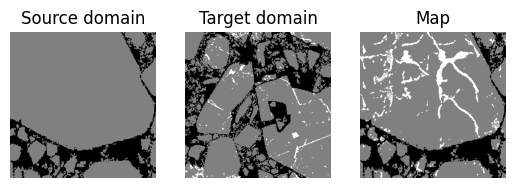


Epoch 35/100 
Training: [--------->] 100 %  - 51 s


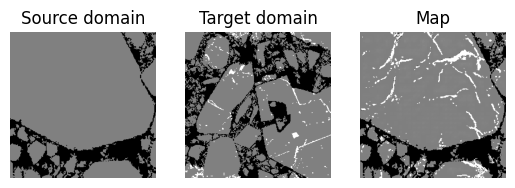


Epoch 36/100 
Training: [--------->] 100 %  - 51 s


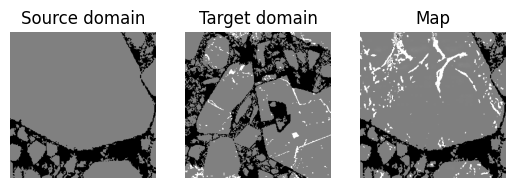


Epoch 37/100 
Training: [--------->] 100 %  - 50 s


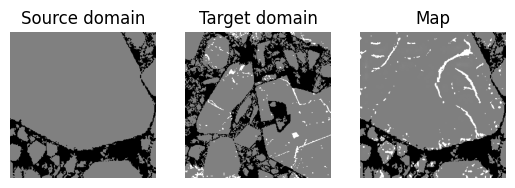


Epoch 38/100 
Training: [--------->] 100 %  - 50 s


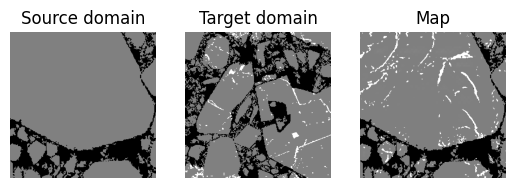


Epoch 39/100 
Training: [--------->] 100 %  - 50 s


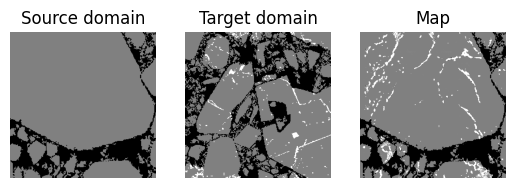


Epoch 40/100 
Training: [--------->] 100 %  - 51 s


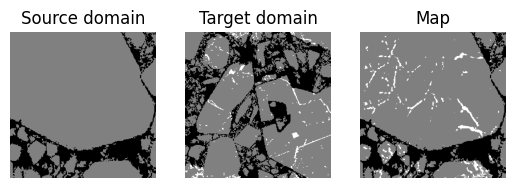


Epoch 41/100 
Training: [--------->] 100 %  - 50 s


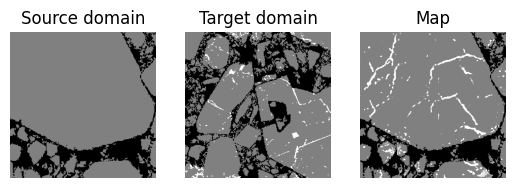


Epoch 42/100 
Training: [--------->] 100 %  - 50 s


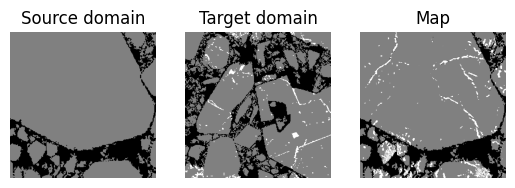


Epoch 43/100 
Training: [--------->] 100 %  - 50 s


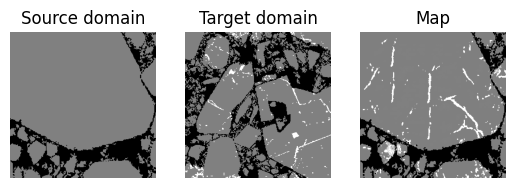


Epoch 44/100 
Training: [--------->] 100 %  - 50 s


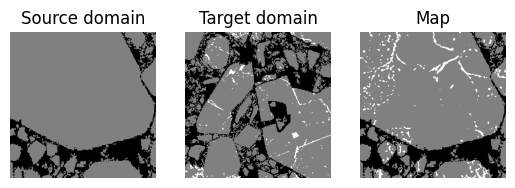


Epoch 45/100 
Training: [--------->] 100 %  - 50 s


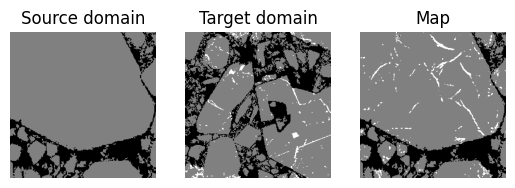


Epoch 46/100 
Training: [--------->] 100 %  - 50 s


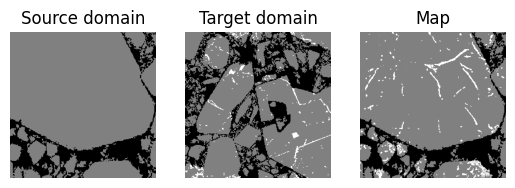


Epoch 47/100 
Training: [--------->] 100 %  - 51 s


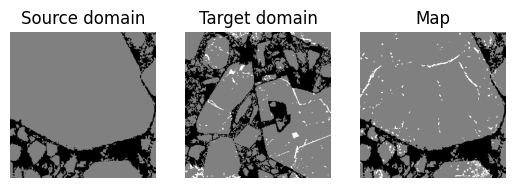


Epoch 48/100 
Training: [--------->] 100 %  - 50 s


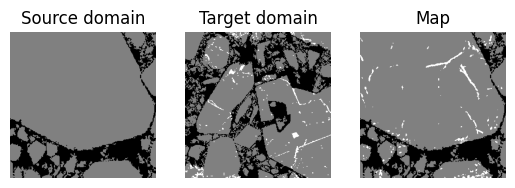


Epoch 49/100 
Training: [--------->] 100 %  - 50 s


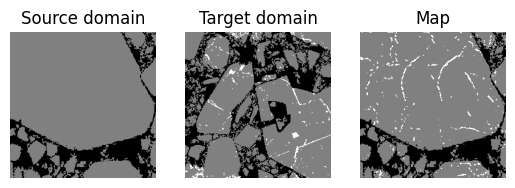


Epoch 50/100 
Training: [--------->] 100 %  - 50 s


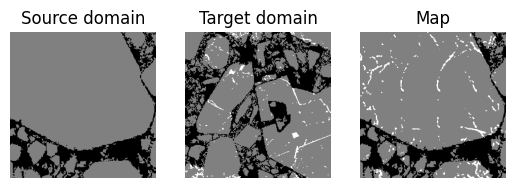


Epoch 51/100 
Training: [--------->] 100 %  - 50 s


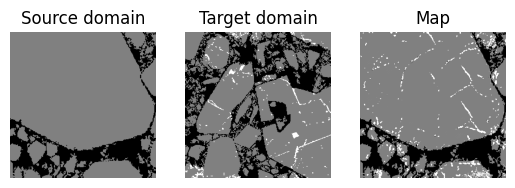


Epoch 52/100 
Training: [--------->] 100 %  - 50 s


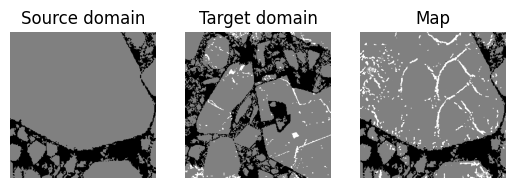


Epoch 53/100 
Training: [--------->] 100 %  - 50 s


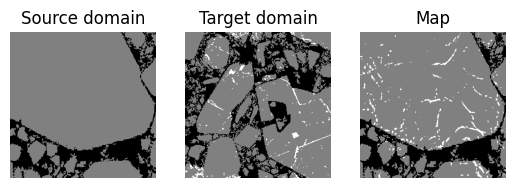


Epoch 54/100 
Training: [--------->] 100 %  - 50 s


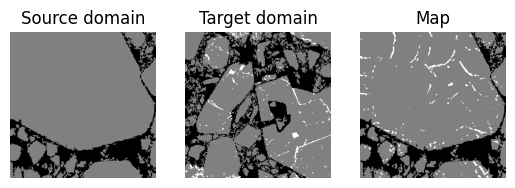


Epoch 55/100 
Training: [--------->] 100 %  - 50 s


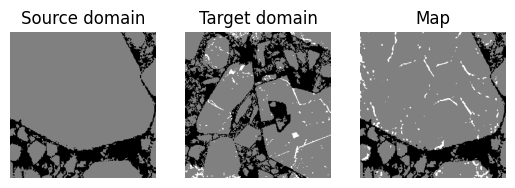


Epoch 56/100 
Training: [--------->] 100 %  - 50 s


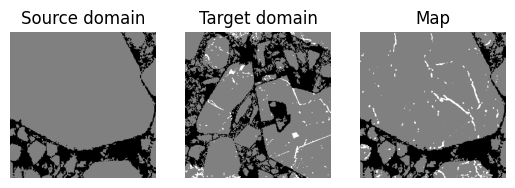


Epoch 57/100 
Training: [--------->] 100 %  - 50 s


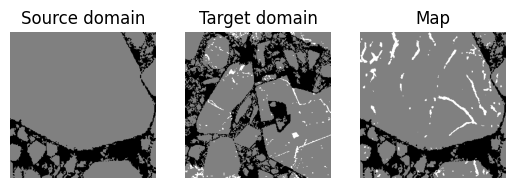


Epoch 58/100 
Training: [--------->] 100 %  - 50 s


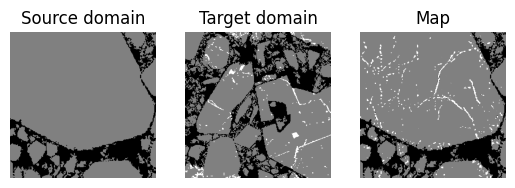


Epoch 59/100 
Training: [--------->] 100 %  - 50 s


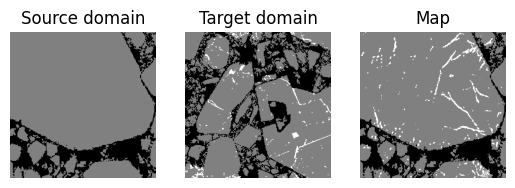


Epoch 60/100 
Training: [--------->] 100 %  - 50 s


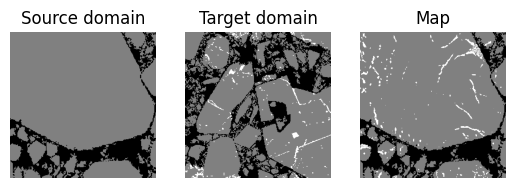


Epoch 61/100 
Training: [--------->] 100 %  - 50 s


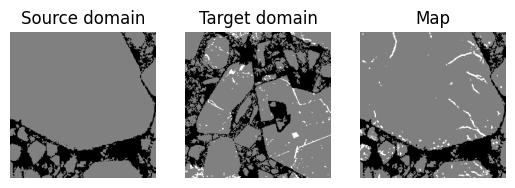


Epoch 62/100 
Training: [--------->] 100 %  - 50 s


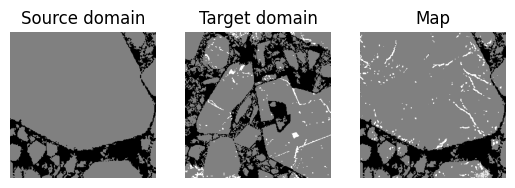


Epoch 63/100 
Training: [--------->] 100 %  - 50 s


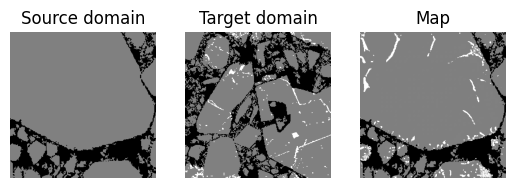


Epoch 64/100 
Training: [--------->] 100 %  - 50 s


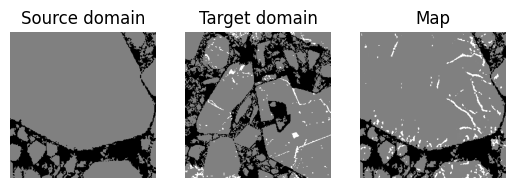


Epoch 65/100 
Training: [--------->] 100 %  - 50 s


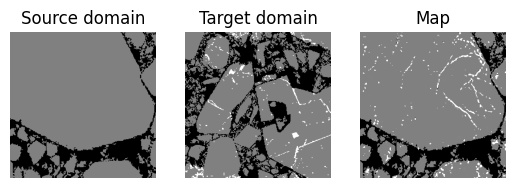


Epoch 66/100 
Training: [--------->] 100 %  - 50 s


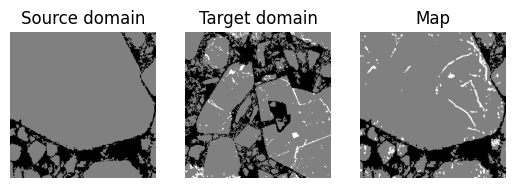


Epoch 67/100 
Training: [--------->] 100 %  - 50 s


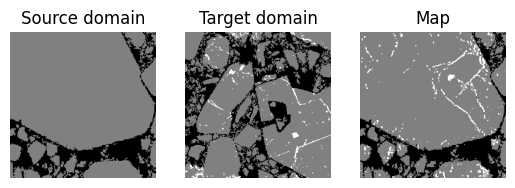


Epoch 68/100 
Training: [--------->] 100 %  - 50 s


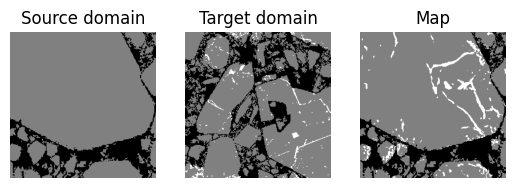


Epoch 69/100 
Training: [--------->] 100 %  - 50 s


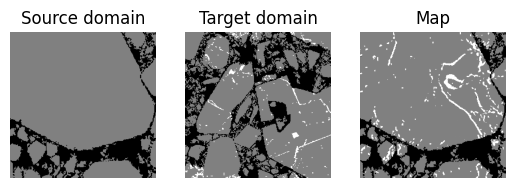


Epoch 70/100 
Training: [--------->] 100 %  - 50 s


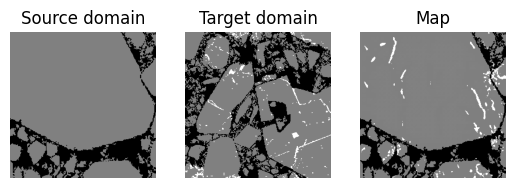


Epoch 71/100 
Training: [--------->] 100 %  - 50 s


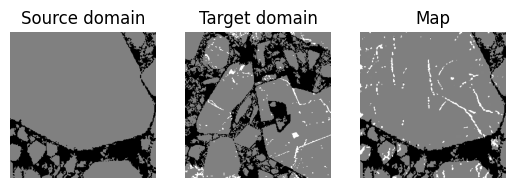


Epoch 72/100 
Training: [--------->] 100 %  - 50 s


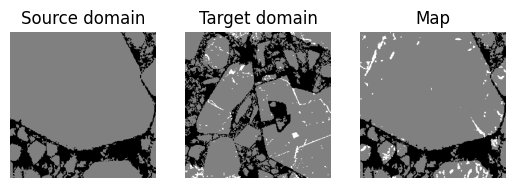


Epoch 73/100 
Training: [--------->] 100 %  - 50 s


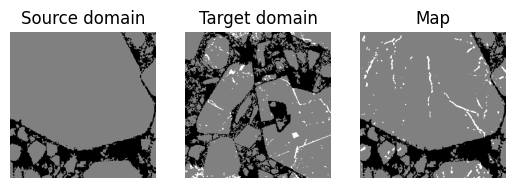


Epoch 74/100 
Training: [--------->] 100 %  - 50 s


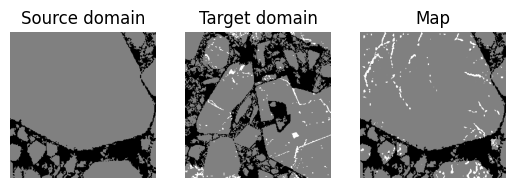


Epoch 75/100 
Training: [--------->] 100 %  - 50 s


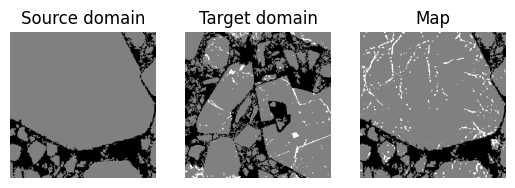


Epoch 76/100 
Training: [--------->] 100 %  - 50 s


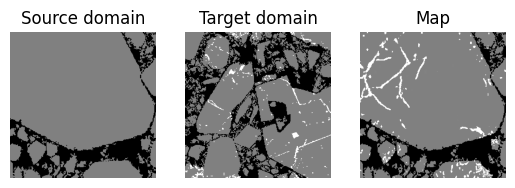


Epoch 77/100 
Training: [--------->] 100 %  - 50 s


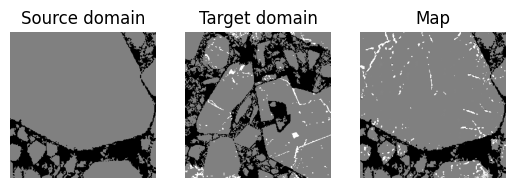


Epoch 78/100 
Training: [--------->] 100 %  - 50 s


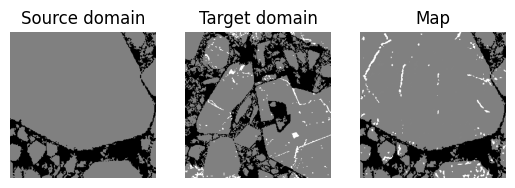


Epoch 79/100 
Training: [--------->] 100 %  - 50 s


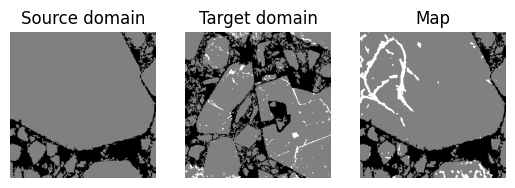


Epoch 80/100 
Training: [--------->] 100 %  - 50 s


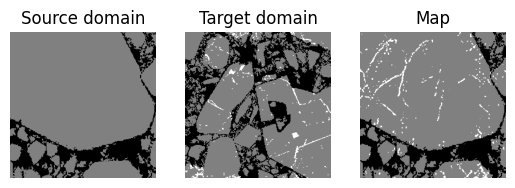


Epoch 81/100 
Training: [--------->] 100 %  - 50 s


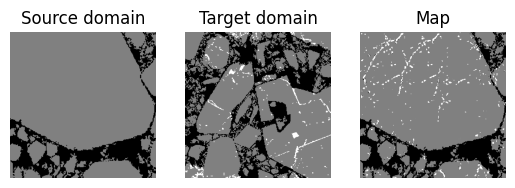


Epoch 82/100 
Training: [--------->] 100 %  - 50 s


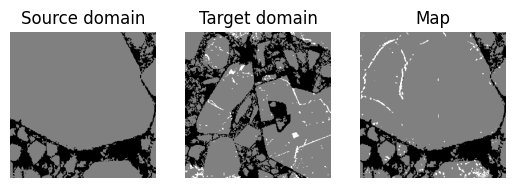


Epoch 83/100 
Training: [--------->] 100 %  - 50 s


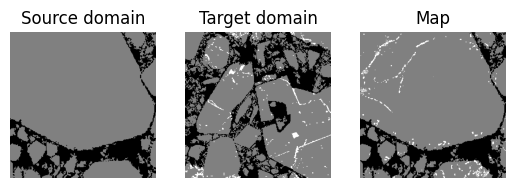


Epoch 84/100 
Training: [--------->] 100 %  - 52 s


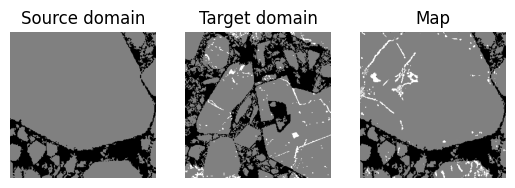


Epoch 85/100 
Training: [--------->] 100 %  - 61 s


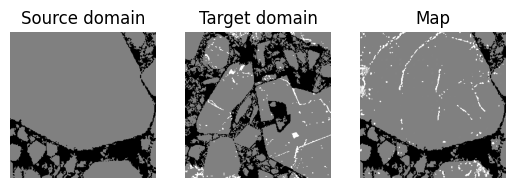


Epoch 86/100 
Training: [--------->] 100 %  - 60 s


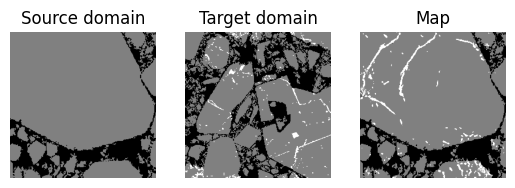


Epoch 87/100 
Training: [--------->] 100 %  - 59 s


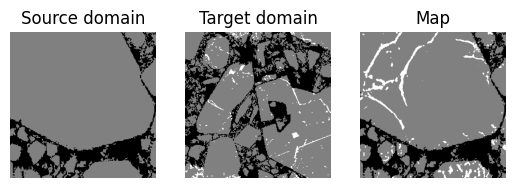


Epoch 88/100 
Training: [--------->] 100 %  - 58 s


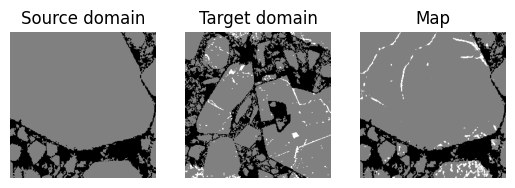


Epoch 89/100 
Training: [--------->] 100 %  - 62 s


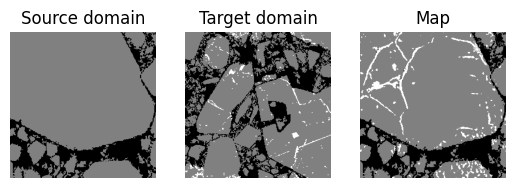


Epoch 90/100 
Training: [--------->] 100 %  - 60 s


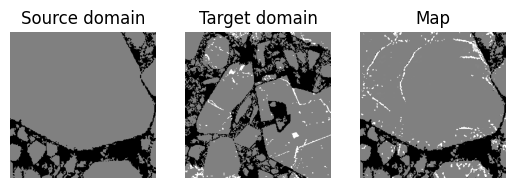


Epoch 91/100 
Training: [--------->] 100 %  - 59 s


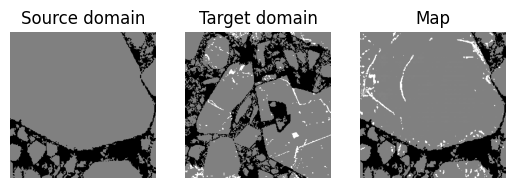


Epoch 92/100 
Training: [--------->] 100 %  - 56 s


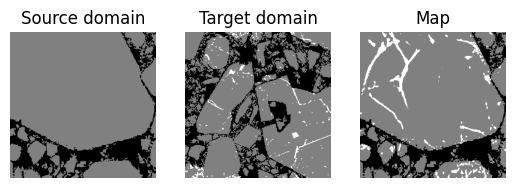


Epoch 93/100 
Training: [--------->] 100 %  - 60 s


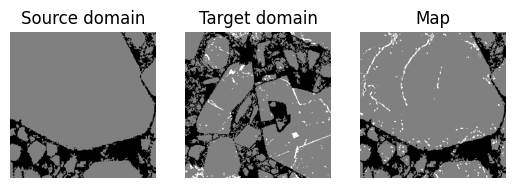


Epoch 94/100 
Training: [--------->] 100 %  - 54 s


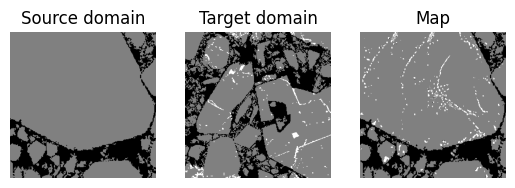


Epoch 95/100 
Training: [--------->] 100 %  - 51 s


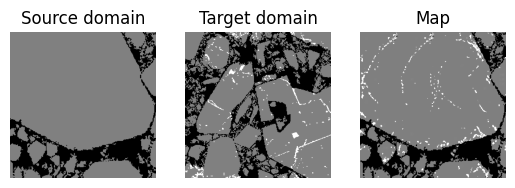


Epoch 96/100 
Training: [--------->] 100 %  - 51 s


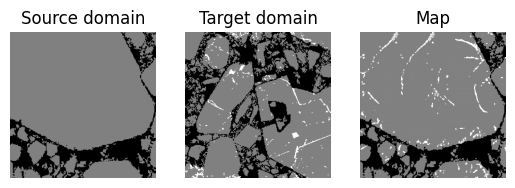


Epoch 97/100 
Training: [--------->] 100 %  - 51 s


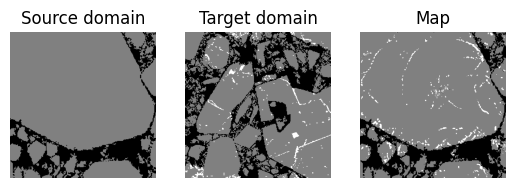


Epoch 98/100 
Training: [--------->] 100 %  - 57 s


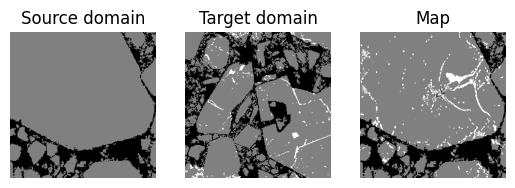


Epoch 99/100 
Training: [--------->] 100 %  - 58 s


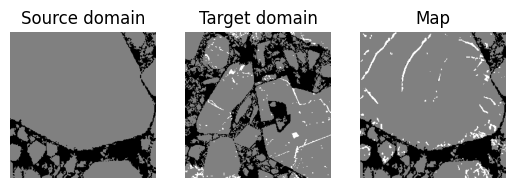


Epoch 100/100 
Training: [--------->] 100 %  - 59 s


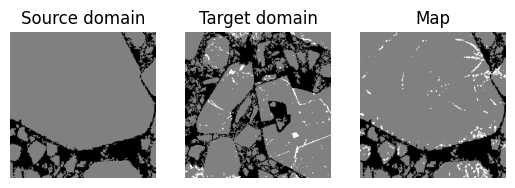

In [47]:
for epoch in range(Epochs):
    start = time.time()
    i = 0
    print ('\nEpoch {}/{} '.format(epoch+1, Epochs))
    for img_a, img_b in train_dataset:
        
        train_discriminator(img_a, img_b)
        train_generator(img_a, img_b)
        
        percent = float(i+1) * 100 / len(train_dataset)
        arrow   = '-' * int(percent/100 * 10 - 1) + '>'
        spaces  = ' ' * (10 - len(arrow))
        print('\rTraining: [%s%s] %d %% '% (arrow, spaces, percent), end='', flush=True)
        i += 1
    print(" -", int(time.time()-start), "s", end="")
    print()
    
    cache = image_show()

In [48]:
results = generator_x.predict(test_a)

200/200 [==============================] - 2s 5ms/step


In [49]:
type(test_a)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [50]:
results.shape

(200, 256, 256, 1)

In [51]:
num_samples = 15

1/1 [==============================] - 0s 17ms/step


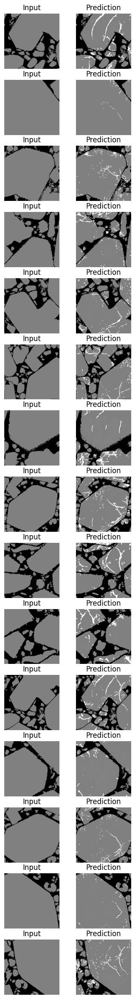

In [53]:
fig, axes = plt.subplots(num_samples, 2, figsize=(4, 2 * num_samples))

dataset_iterator = iter(test_a)

for i in range(num_samples):
    input_image = next(dataset_iterator) 
    prediction = generator_x.predict(input_image)  
    
    # Input image
    ax1 = axes[i, 0]
    input_image = tf.squeeze(input_image, axis=0) 
    ax1.imshow(input_image.numpy(), cmap='gray', vmin=-1, vmax=1)  
    ax1.set_title('Input')
    ax1.axis('off')
    re_normalized_img = (((input_image.numpy() + 1) / 2) * 255).astype(int)
    
    
    # Prediction
    ax2 = axes[i, 1]
    prediction = tf.squeeze(prediction, axis=0)
    ax2.imshow(prediction.numpy(), cmap='gray', vmin=-1, vmax=1) 
    ax2.set_title('Prediction')
    ax2.axis('off')
    re_normalized_img = (((prediction.numpy() + 1) / 2) * 255).astype(int)

plt.show()

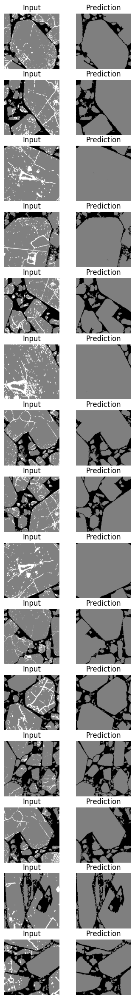

In [54]:
fig, axes = plt.subplots(num_samples, 2, figsize=(4, 2 * num_samples))

dataset_iterator = iter(test_b)

for i in range(num_samples):
    input_image = next(dataset_iterator)  
    prediction = [generator_y(image[np.newaxis],training=True).numpy() for image in input_image]  
    
    ax1 = axes[i,0]
    input_image = tf.squeeze(input_image, axis=0)  
    ax1.imshow(input_image.numpy(), cmap='gray', vmin=-1, vmax=1) 
    ax1.set_title('Input')
    ax1.axis('off')
    re_normalized_img = (((input_image.numpy() + 1) / 2) * 255).astype(int)
    #cv2.imwrite('single_img_results/input_%i.png' % i, re_normalized_img)
    
    
    ax2 = axes[i,1]
    prediction = tf.squeeze(prediction, axis=0) 
    ax2.imshow(prediction.numpy()[0], cmap='gray', vmin=-1, vmax=1) 
    ax2.set_title('Prediction')
    ax2.axis('off')
    re_normalized_img = (((prediction.numpy() + 1) / 2) * 255).astype(int)


In [56]:
generator_x.save("CycleGANv2_three_phase_generator_x.keras")
generator_y.save("CycleGANv2_three_phase_generator_y.keras")

In [58]:
with tf.device('/gpu:0'):
    single_input_set = prepare_dataset_a(['1.png'] * num_samples)

Fetching: [15/15]
Execution time:  0.06709861755371094 s


In [59]:
AUTOTUNE = tf.data.AUTOTUNE
BUFFER_SIZE = 200

single_input_set = tf.data.Dataset.from_tensor_slices(single_input_set)
single_input_set = single_input_set.map(map, num_parallel_calls=AUTOTUNE).shuffle(BUFFER_SIZE).batch(1).prefetch(AUTOTUNE)

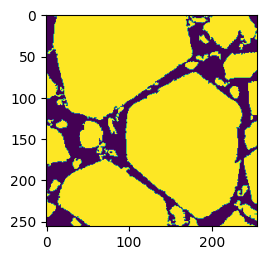

In [60]:
plt.figure(figsize=(6, 3))
for single  in single_input_set.take(1):
    plt.subplot(1,2,1)
    plt.imshow((single[0]+1)/2)

In [61]:
loaded_model = tf.keras.models.load_model('CycleGANv2_three_phase_generator_x.keras', safe_mode=False)

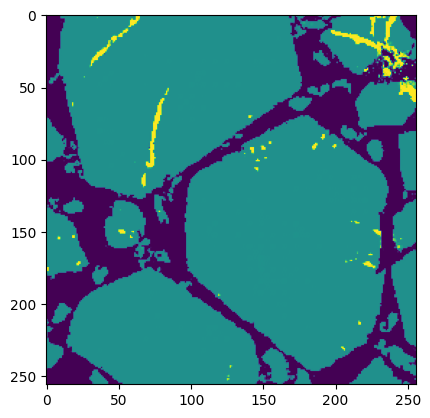

In [62]:
for image in single_input_set:
    predictions = loaded_model(image, training=True)
    predictions_np = predictions.numpy()
    plt.imshow(predictions_np[0])

In [63]:
single_input_preds = []
for image in single_input_set:
    predictions = loaded_model(image, training=True)
    predictions_np = predictions.numpy()
    single_input_preds.append(predictions_np[0])

In [64]:
single_input_preds = np.array(single_input_preds)

In [65]:
single_input_preds.shape

(15, 256, 256, 1)

In [66]:
import matplotlib.image as mpimg

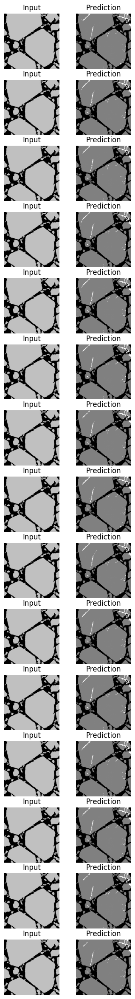

In [67]:
fig, axes = plt.subplots(num_samples, 2, figsize=(4, 2 * num_samples))

for i in range(num_samples):
    img = mpimg.imread('1.png')
    ax1 = axes[i,0]
    ax1.imshow(img, cmap='gray') 
    ax1.set_title('Input')
    ax1.axis('off')
    # re_normalized_img = (((input_image.numpy() + 1) / 2) * 255).astype(int)
    #cv2.imwrite('single_img_results/input_%i.png' % i, re_normalized_img)
    
    
    ax2 = axes[i,1]
    ax2.imshow(single_input_preds[i], cmap='gray')  
    ax2.set_title('Prediction')
    ax2.axis('off')
    # re_normalized_img = (((prediction.numpy() + 1) / 2) * 255).astype(int)

    #cv2.imwrite('single_img_results/result_%i.png' % i, re_normalized_img)

plt.show()

In [51]:
converted_image = ((single_input_preds[0] + 1) / 2) * 255
converted_image_uint8 = np.round(converted_image).astype(np.uint8)

In [52]:
np.unique(converted_image_uint8)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  74,  75,  76,  77,  78,  79,
        80,  81,  82,  85,  87,  88,  89,  90,  91,  92,  93,  94,  96,
        97,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110,
       111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123,
       124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136,
       137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149,
       150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162,
       163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175,
       176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 18